# Knowledge Assembly

In [ ]:
from nellinetwork import Network
from helpers import fit_sigmoid, mean_squared_error, rotate, load_behavioural_data
from plotting import plotting_init, matrix_plot, mds_plot

import torch
import numpy as np
from scipy.special import expit
from sklearn import manifold
from sklearn.metrics import euclidean_distances

import matplotlib.pyplot as plt
import seaborn as sns

from multiprocessing import Pool

In [ ]:
midd_performance, high_performers, low_performers = load_behavioural_data("./behavioural-data/")

## Set simulation mode

In [ ]:
mode = "main" # "lazy-regime", "two-readouts", "fixed-inputs"

## Set Hyperparameters

In [ ]:
# Random seeds
seeds_n = 10
mds_seed = 1

# Number of input items
items_n = 7

# Experiment details
training_blocks = 16 if mode == "two-readouts" else 8
trials = 60
training_length = 2 * training_blocks * trials
stitching_steps = 20

# Network hyperparameters
readouts = 2 if mode == "two-readouts" else 1
h1_size = 20

if mode == "lazy-regime":
    w1_weight_std = np.sqrt(6. / items_n)
    w2_weight_std = np.sqrt(10. / h1_size)
else:
    w1_weight_std = 0.025 * np.sqrt(1 / items_n)
    w2_weight_std = np.sqrt(1 / h1_size)

learning_rate = 0.03 if mode == "lazy-regime" else 0.05

# Parameter space for gridsearch
gammas = np.concatenate([[0], np.geomspace(1e-4, 1, 69)])
ss = np.geomspace(1e-2, 100, 65)

## Train Networks

[NOTE] The training pairs are changed

TODOs:
* Remove stitch

In [ ]:
np.asarray(zip(range(0, 6), range(1, 7)))

In [ ]:
items_per_context = 7
p = 5
q = 3
training_pairs_norm = np.asarray(list(zip(range(0, items_per_context - 1), range(1, items_per_context))))
training_pairs_exp = np.asarray([[p,q]])
training_pairs = np.concatenate([training_pairs_norm, training_pairs_exp], axis=0)
print(training_pairs)

Scratch

In [ ]:
items_per_context = 7
p = 5
q = 3
training_pairs_norm = np.asarray(list(zip(range(0, items_per_context - 1), range(1, items_per_context))))
training_pairs_exp = np.asarray([[p,q]])
training_pairs = np.concatenate([training_pairs_norm, training_pairs_exp], axis=0)

print(training_pairs)
for trial in range(trials):
    # Sample input and target
    random_index = np.random.randint(0, len(training_pairs))
    item_1, item_2 = np.random.choice(training_pairs[random_index], 2, False)
    if readouts == 1:
        if item_1 == p and item_2 == q or item_1 == q and item_2 == p:
            exception = True
        else:
            exception = False
        if not exception:
            target = torch.tensor([1. if item_1 > item_2 else -1.])
        else:
            target = torch.tensor([-1. if item_1 > item_2 else 1.])
        print(item_1, item_2)
        print(target)


    #UNCHANGED SO FAR
    elif readouts == 2:
        target = torch.tensor([1., -1.] if item_1 > item_2 else [-1., 1.])


In [ ]:
seeds_n

In [30]:
gamma = 0

def train_networks(gamma):
    # Log
    results = {
        "train": {
            "losses": np.zeros((seeds_n, training_length)),
            "w1s": np.zeros((seeds_n, training_length, h1_size, items_n)),
            "w2s": np.zeros((seeds_n, training_length, readouts, h1_size)),
            "h1s": np.zeros((seeds_n, training_length, items_n, h1_size)),
            "certainties": np.zeros((seeds_n, training_length, items_n, items_n)),
            "evals": np.zeros((seeds_n, items_n, items_n))
        },
        # "stitch": {
        #     "losses": np.zeros((seeds_n, stitching_steps)),
        #     "w1s": np.zeros((seeds_n, stitching_steps, h1_size, items_n)),
        #     "w2s": np.zeros((seeds_n, stitching_steps, readouts, h1_size)),
        #     "certainties": np.zeros((seeds_n, stitching_steps, items_n, items_n)),
        #     "h1s": np.zeros((seeds_n, stitching_steps, items_n, h1_size)),
        #     "evals": np.zeros((seeds_n, items_n, items_n)),
        # }
    }
    
    if gamma == 0.:
        results["train"]["training_progress"] = np.zeros((seeds_n, training_length, items_n, items_n))
    
    for seed in range(seeds_n):
        np.random.seed(seed)
        torch.manual_seed(seed)
    
        # Init Network
        model = Network(items_n, h1_size, w1_weight_std, w2_weight_std, readouts=readouts)
        criterion = torch.nn.MSELoss()
        optimiser = torch.optim.SGD(model.parameters(), lr=learning_rate)

        training_step = 0
        items_per_context = items_n
        
        for block in range(training_blocks): 
            items_per_context = 7
            p = 4
            q = 2
            training_pairs_norm = np.asarray(list(zip(range(0, items_per_context - 1), range(1, items_per_context))))
            training_pairs_exp = np.asarray([[p,q]])
            training_pairs = np.concatenate([training_pairs_norm, training_pairs_exp], axis=0)
            for trial in range(trials):
                # Sample input and target
                random_index = np.random.randint(0, len(training_pairs))
                item_1, item_2 = np.random.choice(training_pairs[random_index], 2, False)
                if readouts == 1:
                    if item_1 == p and item_2 == q or item_1 == q and item_2 == p:
                        exception = True
                    else:
                        exception = False
                    if not exception:
                        target = torch.tensor([1. if item_1 > item_2 else -1.])
                    else:
                        target = torch.tensor([-1. if item_1 > item_2 else 1.])

                #UNCHANGED SO FAR
                elif readouts == 2:
                    target = torch.tensor([1., -1.] if item_1 > item_2 else [-1., 1.])

                # Forward propagate and backpropagate
                optimiser.zero_grad()
                _, output = model(item_1, item_2)
                model.loss = criterion(output, target)
                model.loss.backward()
                model.correct(learning_rate, gamma)
                optimiser.step()

                # Log
                with torch.no_grad():
                    results["train"]["losses"][seed, training_step] = model.loss.item()
                    results["train"]["w1s"][seed, training_step] = model.layer_1.weight.detach().numpy().copy()
                    results["train"]["w2s"][seed, training_step] = model.layer_2.weight.detach().numpy().copy()
                    results["train"]["h1s"][seed, training_step] = model.extract_h1s()
                    results["train"]["certainties"][seed, training_step] = model.pairwise_certainty.a.copy()
                    if gamma == 0.:
                        results["train"]["training_progress"][seed, training_step] = model.evaluate()
                
                print("item_1", item_1)
                print("item_1", item_2)
                print("target", target)
                print("output", output)
                
                training_step += 1
                print("training_step:", training_step)
        
        # Evaluate
        with torch.no_grad():
            results["train"]["evals"][seed] = model.evaluate()

        # # Stitching
        # for stitching_step in range(stitching_steps):
        #     # Select items from boundary condition
        #     item_1, item_2 = np.random.choice([(items_n // 2) - 1, (items_n // 2)], 2, replace=False)
        #     if readouts == 1:
        #         target = torch.tensor([1. if item_1 > item_2 else -1.])
        #     elif readouts == 2:
        #         target = torch.tensor([1., -1.] if item_1 > item_2 else [-1., 1.])
                

        #     # Forward propagate and backpropagate
        #     optimiser.zero_grad()
        #     h1, output = model(item_1, item_2)
        #     model.loss = criterion(output, target)
        #     model.loss.backward()
        #     model.correct(learning_rate, gamma)
            
        #     if mode == "fixed-inputs":
        #         model.layer_1.weight.grad *= 0.
            
        #     optimiser.step()
            
        #     # Log
        #     with torch.no_grad():
        #         results["stitch"]["losses"][seed, stitching_step] = model.loss.item()
        #         results["stitch"]["w1s"][seed, stitching_step] = model.layer_1.weight.detach().numpy().copy()
        #         results["stitch"]["w2s"][seed, stitching_step] = model.layer_2.weight.detach().numpy().copy()
        #         results["stitch"]["h1s"][seed, stitching_step] = model.extract_h1s()
        #         results["stitch"]["certainties"][seed, stitching_step] = model.pairwise_certainty.a.copy()

        # # Evaluate
        # with torch.no_grad():
        #     results["stitch"]["evals"][seed] = model.evaluate()
        
    return results

results = train_networks(0)
# results = {gamma: result for gamma, result in results}
print(results)


# with Pool(20) as p:
#     results = p.map(train_networks, gammas)
# results = {gamma: result for gamma, result in results}

item_1 4
item_1 5
target tensor([-1.])
output tensor([0.0068], grad_fn=<SqueezeBackward4>)
training_step: 1
item_1 6
item_1 5
target tensor([1.])
output tensor([-0.0446], grad_fn=<SqueezeBackward4>)
training_step: 2
item_1 3
item_1 4
target tensor([-1.])
output tensor([0.0763], grad_fn=<SqueezeBackward4>)
training_step: 3
item_1 3
item_1 4
target tensor([-1.])
output tensor([-0.0503], grad_fn=<SqueezeBackward4>)
training_step: 4
item_1 1
item_1 2
target tensor([-1.])
output tensor([0.0039], grad_fn=<SqueezeBackward4>)
training_step: 5
item_1 6
item_1 5
target tensor([1.])
output tensor([0.0049], grad_fn=<SqueezeBackward4>)
training_step: 6
item_1 4
item_1 5
target tensor([-1.])
output tensor([-0.0273], grad_fn=<SqueezeBackward4>)
training_step: 7
item_1 2
item_1 4
target tensor([1.])
output tensor([-0.0010], grad_fn=<SqueezeBackward4>)
training_step: 8
item_1 1
item_1 0
target tensor([1.])
output tensor([-0.0306], grad_fn=<SqueezeBackward4>)
training_step: 9
item_1 2
item_1 3
target te

# Margins with TI Exp

Text(0.5, 1.0, 'Nelli Model: Margin of exception pair ({p},{q})')

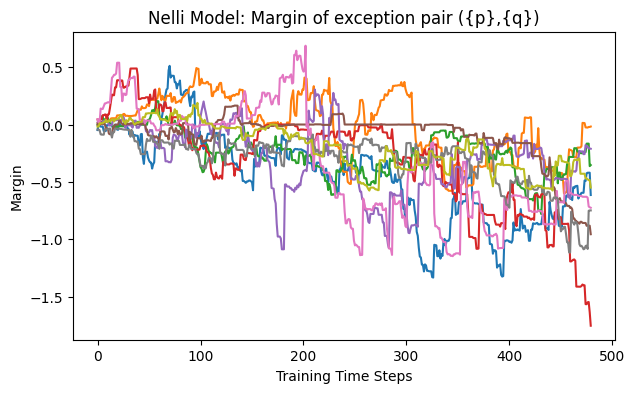

In [31]:
plt.figure(figsize=(7,4))
for i in range(0, seeds_n-1):
    plt.plot(results["train"]["training_progress"][i, :480, p,q])
plt.xlabel("Training Time Steps"); plt.ylabel("Margin")
plt.title("Nelli Model: Margin of exception pair ({p},{q})")

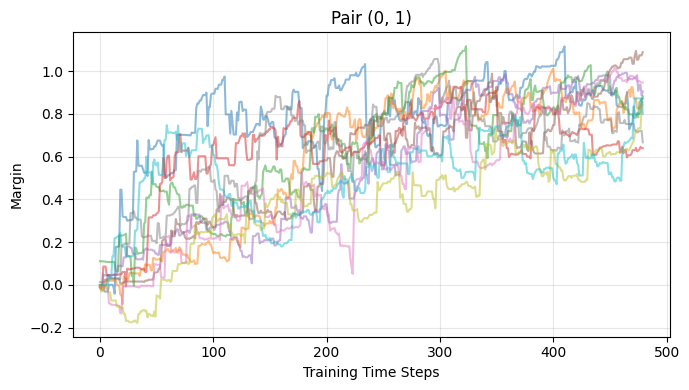

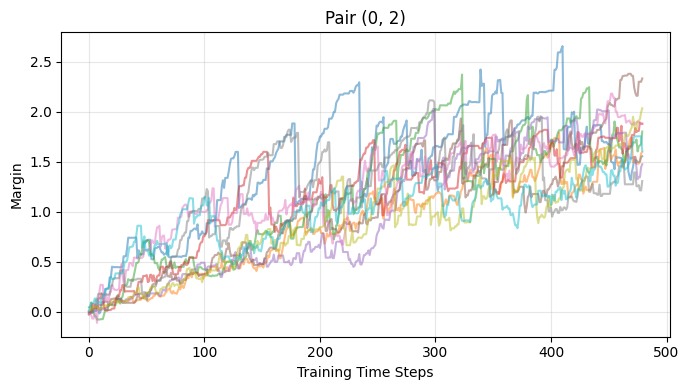

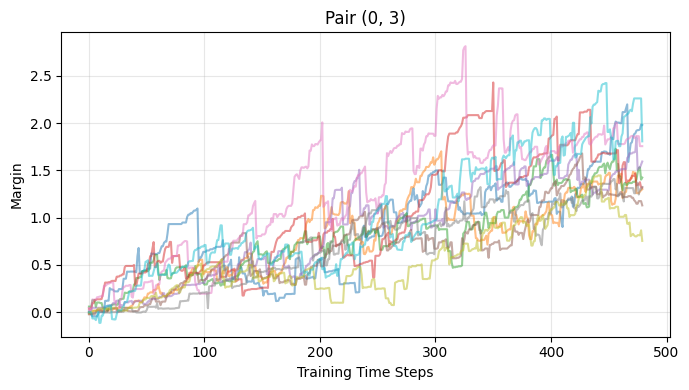

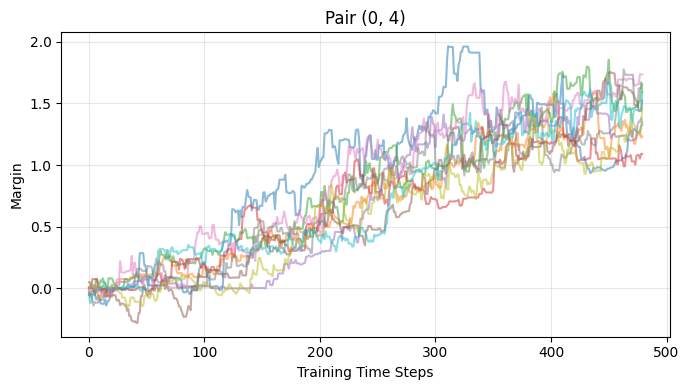

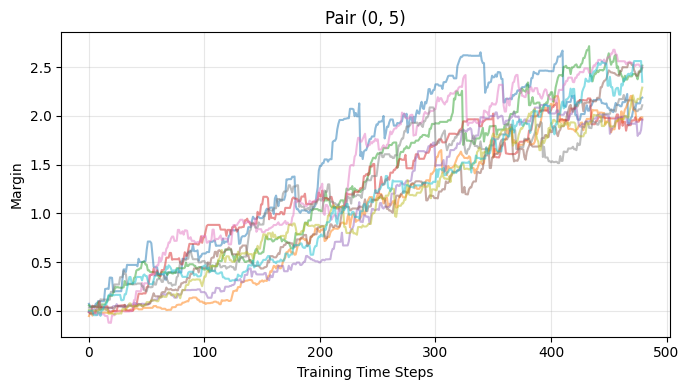

...

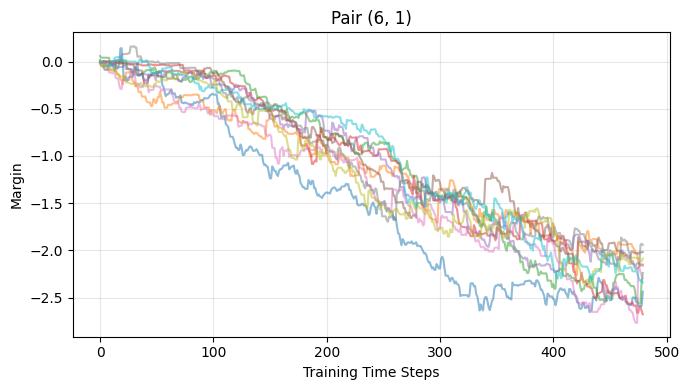

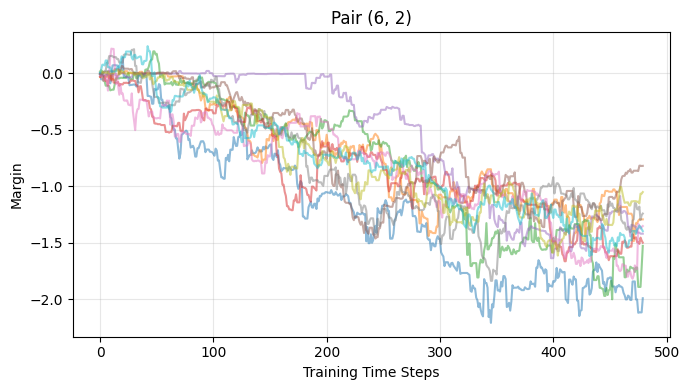

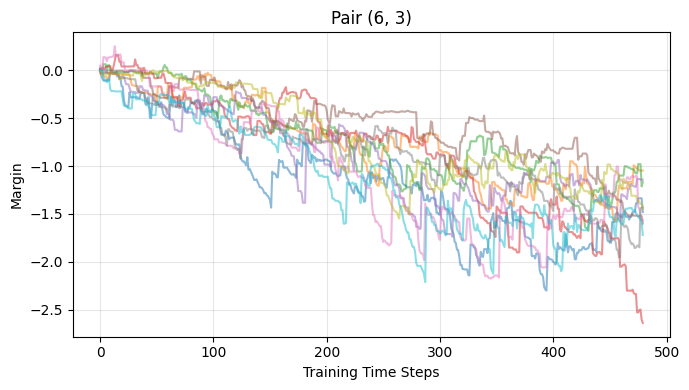

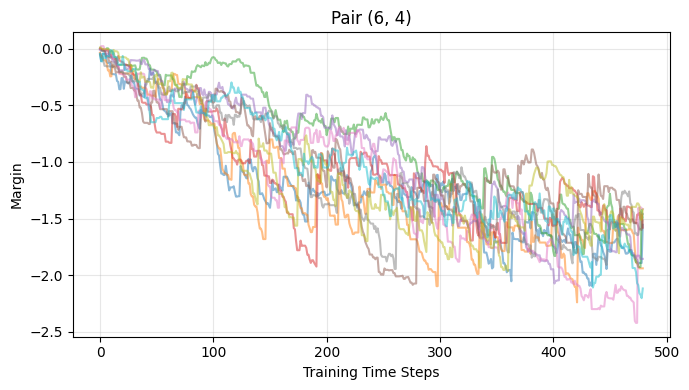

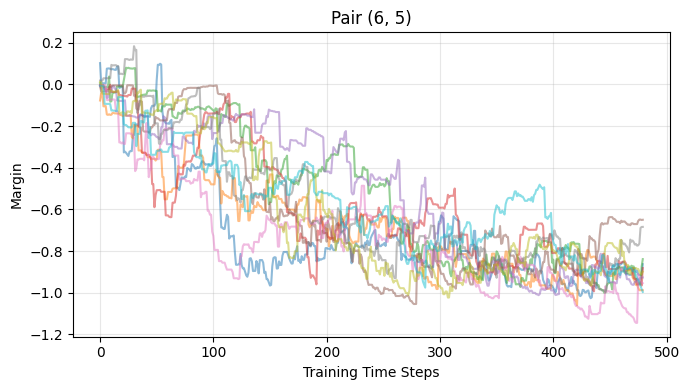

In [32]:
# Plot for every possible pair (i, j) in different figures
# If results is a tuple, unpack it to get the actual results dict
if isinstance(results, tuple):
    results = results[1]
training_progress = results["train"]["training_progress"]
seeds_n = training_progress.shape[0]
items_n = training_progress.shape[2]

for i in range(items_n):
    for j in range(items_n):
        if i == j:
            continue  # skip diagonal if desired
        plt.figure(figsize=(7,4))
        for seed in range(seeds_n):
            plt.plot(training_progress[seed, :480, i, j], alpha=0.5)
        plt.xlabel("Training Time Steps")
        plt.ylabel("Margin")
        plt.title(f"Pair ({i}, {j})")
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()

# Test if this with the regular training is ok

In [37]:
training_pairs = np.asarray(list(zip(range(0, items_per_context - 1), range(1, items_per_context))))

gamma = 0

def train_networks(gamma):
    # Log
    results = {
        "train": {
            "losses": np.zeros((seeds_n, training_length)),
            "w1s": np.zeros((seeds_n, training_length, h1_size, items_n)),
            "w2s": np.zeros((seeds_n, training_length, readouts, h1_size)),
            "h1s": np.zeros((seeds_n, training_length, items_n, h1_size)),
            "certainties": np.zeros((seeds_n, training_length, items_n, items_n)),
            "evals": np.zeros((seeds_n, items_n, items_n))
        },
        # "stitch": {
        #     "losses": np.zeros((seeds_n, stitching_steps)),
        #     "w1s": np.zeros((seeds_n, stitching_steps, h1_size, items_n)),
        #     "w2s": np.zeros((seeds_n, stitching_steps, readouts, h1_size)),
        #     "certainties": np.zeros((seeds_n, stitching_steps, items_n, items_n)),
        #     "h1s": np.zeros((seeds_n, stitching_steps, items_n, h1_size)),
        #     "evals": np.zeros((seeds_n, items_n, items_n)),
        # }
    }
    
    if gamma == 0.:
        results["train"]["training_progress"] = np.zeros((seeds_n, training_length, items_n, items_n))
    
    for seed in range(seeds_n):
        np.random.seed(seed)
        torch.manual_seed(seed)
    
        # Init Network
        model = Network(items_n, h1_size, w1_weight_std, w2_weight_std, readouts=readouts)
        criterion = torch.nn.MSELoss()
        optimiser = torch.optim.SGD(model.parameters(), lr=learning_rate)

        training_step = 0
        items_per_context = items_n
        
        for block in range(training_blocks): 
            items_per_context = 7
            training_pairs = np.asarray(list(zip(range(0, items_per_context - 1), range(1, items_per_context))))
            for trial in range(trials):
                # Sample input and target
                random_index = np.random.randint(0, len(training_pairs))
                item_1, item_2 = np.random.choice(training_pairs[random_index], 2, False)
                if readouts == 1:
                    target = torch.tensor([1. if item_1 > item_2 else -1.])
                elif readouts == 2:
                    target = torch.tensor([1., -1.] if item_1 > item_2 else [-1., 1.])

                # Forward propagate and backpropagate
                optimiser.zero_grad()
                _, output = model(item_1, item_2)
                model.loss = criterion(output, target)
                model.loss.backward()
                model.correct(learning_rate, gamma)
                optimiser.step()

                # Log
                with torch.no_grad():
                    results["train"]["losses"][seed, training_step] = model.loss.item()
                    results["train"]["w1s"][seed, training_step] = model.layer_1.weight.detach().numpy().copy()
                    results["train"]["w2s"][seed, training_step] = model.layer_2.weight.detach().numpy().copy()
                    results["train"]["h1s"][seed, training_step] = model.extract_h1s()
                    results["train"]["certainties"][seed, training_step] = model.pairwise_certainty.a.copy()
                    results["train"]["training_progress"][seed, training_step] = model.evaluate()
                
                print("item_1", item_1)
                print("item_1", item_2)
                print("target", target)
                print("output", output)
                
                training_step += 1
                print("training_step:", training_step)
        
        # Evaluate
        with torch.no_grad():
            results["train"]["evals"][seed] = model.evaluate()

        # # Stitching
        # for stitching_step in range(stitching_steps):
        #     # Select items from boundary condition
        #     item_1, item_2 = np.random.choice([(items_n // 2) - 1, (items_n // 2)], 2, replace=False)
        #     if readouts == 1:
        #         target = torch.tensor([1. if item_1 > item_2 else -1.])
        #     elif readouts == 2:
        #         target = torch.tensor([1., -1.] if item_1 > item_2 else [-1., 1.])
                

        #     # Forward propagate and backpropagate
        #     optimiser.zero_grad()
        #     h1, output = model(item_1, item_2)
        #     model.loss = criterion(output, target)
        #     model.loss.backward()
        #     model.correct(learning_rate, gamma)
            
        #     if mode == "fixed-inputs":
        #         model.layer_1.weight.grad *= 0.
            
        #     optimiser.step()
            
        #     # Log
        #     with torch.no_grad():
        #         results["stitch"]["losses"][seed, stitching_step] = model.loss.item()
        #         results["stitch"]["w1s"][seed, stitching_step] = model.layer_1.weight.detach().numpy().copy()
        #         results["stitch"]["w2s"][seed, stitching_step] = model.layer_2.weight.detach().numpy().copy()
        #         results["stitch"]["h1s"][seed, stitching_step] = model.extract_h1s()
        #         results["stitch"]["certainties"][seed, stitching_step] = model.pairwise_certainty.a.copy()

        # # Evaluate
        # with torch.no_grad():
        #     results["stitch"]["evals"][seed] = model.evaluate()
        
    return results

results = train_networks(0)
# results = {gamma: result for gamma, result in results}
print(results)


# with Pool(20) as p:
#     results = p.map(train_networks, gammas)
# results = {gamma: result for gamma, result in results}

item_1 4
item_1 5
target tensor([-1.])
output tensor([0.0068], grad_fn=<SqueezeBackward4>)
training_step: 1
item_1 6
item_1 5
target tensor([1.])
output tensor([-0.0446], grad_fn=<SqueezeBackward4>)
training_step: 2
item_1 3
item_1 4
target tensor([-1.])
output tensor([0.0763], grad_fn=<SqueezeBackward4>)
training_step: 3
item_1 3
item_1 4
target tensor([-1.])
output tensor([-0.0503], grad_fn=<SqueezeBackward4>)
training_step: 4
item_1 1
item_1 2
target tensor([-1.])
output tensor([0.0039], grad_fn=<SqueezeBackward4>)
training_step: 5
item_1 6
item_1 5
target tensor([1.])
output tensor([0.0049], grad_fn=<SqueezeBackward4>)
training_step: 6
item_1 4
item_1 5
target tensor([-1.])
output tensor([-0.0273], grad_fn=<SqueezeBackward4>)
training_step: 7
item_1 1
item_1 0
target tensor([1.])
output tensor([-0.0308], grad_fn=<SqueezeBackward4>)
training_step: 8
item_1 5
item_1 4
target tensor([1.])
output tensor([0.0213], grad_fn=<SqueezeBackward4>)
training_step: 9
item_1 2
item_1 1
target ten

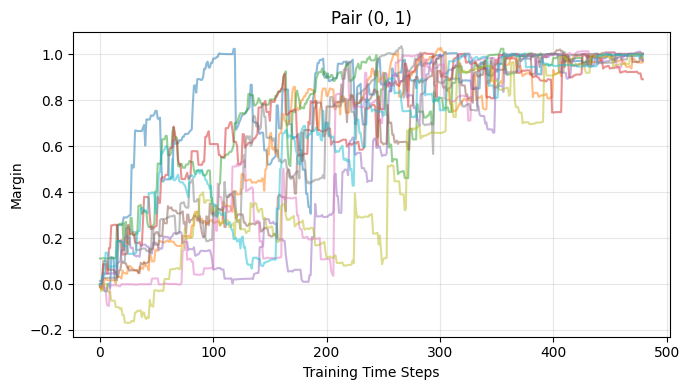

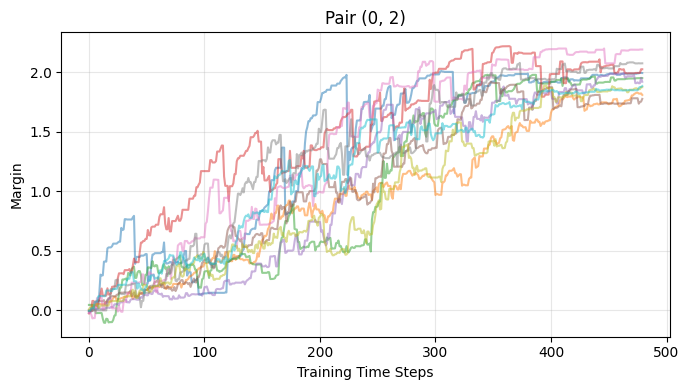

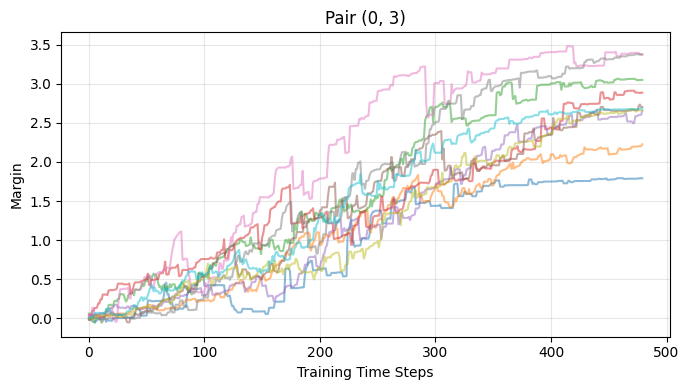

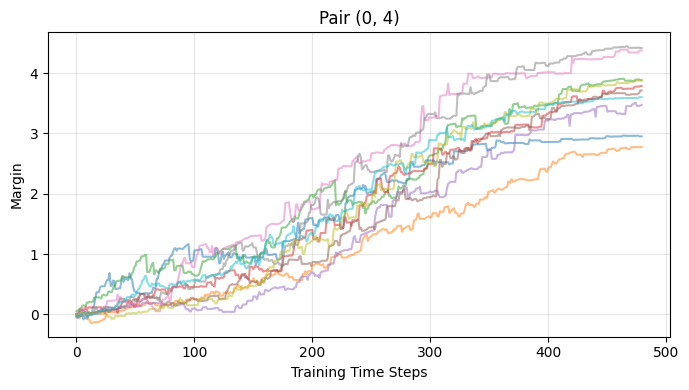

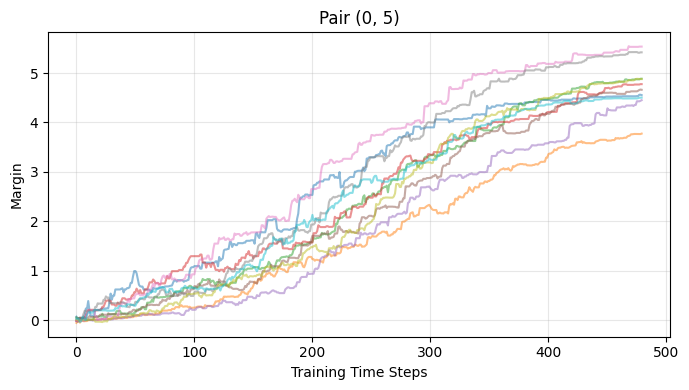

...

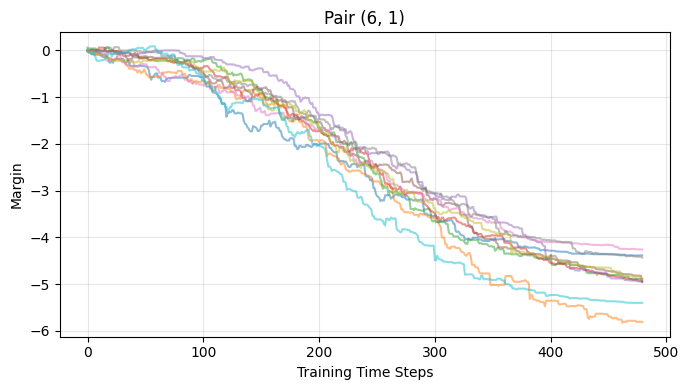

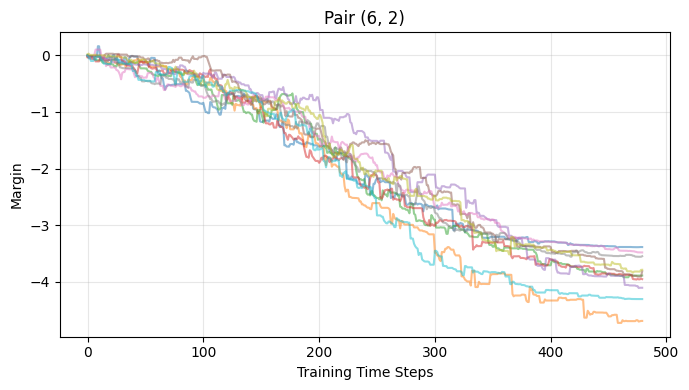

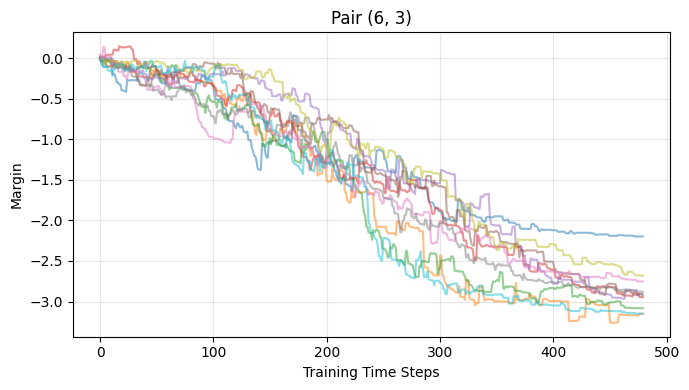

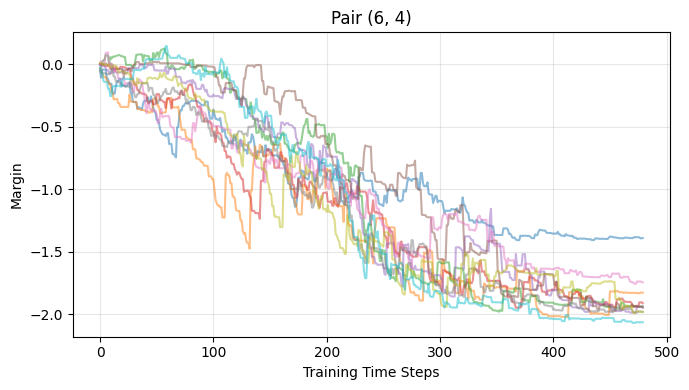

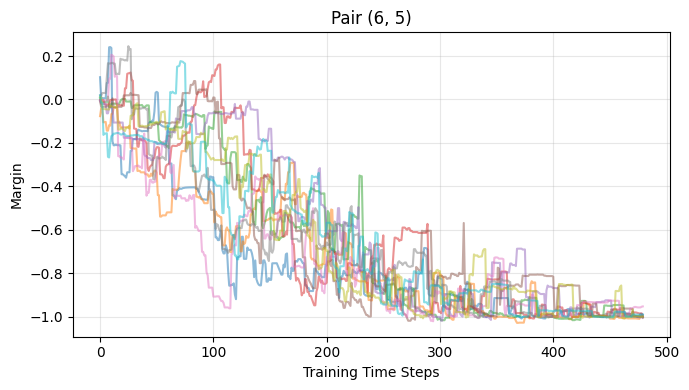

In [38]:
# Plot for every possible pair (i, j) in different figures
# If results is a tuple, unpack it to get the actual results dict
if isinstance(results, tuple):
    results = results[1]
training_progress = results["train"]["training_progress"]
seeds_n = training_progress.shape[0]
items_n = training_progress.shape[2]

for i in range(items_n):
    for j in range(items_n):
        if i == j:
            continue  # skip diagonal if desired
        plt.figure(figsize=(7,4))
        for seed in range(seeds_n):
            plt.plot(training_progress[seed, :480, i, j], alpha=0.5)
        plt.xlabel("Training Time Steps")
        plt.ylabel("Margin")
        plt.title(f"Pair ({i}, {j})")
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()

# Test regular training with optimal gamma

In [36]:
results = train_networks(.1)

# Plot for every possible pair (i, j) in different figures
# If results is a tuple, unpack it to get the actual results dict
if isinstance(results, tuple):
    results = results[1]
training_progress = results["train"]["training_progress"]
seeds_n = training_progress.shape[0]
items_n = training_progress.shape[2]

for i in range(items_n):
    for j in range(items_n):
        if i == j:
            continue  # skip diagonal if desired
        plt.figure(figsize=(7,4))
        for seed in range(seeds_n):
            plt.plot(training_progress[seed, :480, i, j], alpha=0.5)
        plt.xlabel("Training Time Steps")
        plt.ylabel("Margin")
        plt.title(f"Pair ({i}, {j})")
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()

KeyError: 'training_progress'

In [ ]:
gamma = 0

"""
Complete modified train_networks function with symbolic distance tracking
Copy this to replace your existing train_networks function
"""

from collections import defaultdict
import csv
import os
from tqdm.auto import tqdm  # Use tqdm.auto for Jupyter compatibility

def get_symbolic_distance(i, j):
    """Calculate symbolic distance between pair (i, j)"""
    return abs(j - i)

def get_all_pairs_by_distance(items_n):
    """Get all valid pairs organized by symbolic distance"""
    pairs_by_distance = defaultdict(list)
    
    for i in range(items_n):
        for j in range(items_n):
            if i != j:  # Exclude diagonal pairs
                distance = get_symbolic_distance(i, j)
                if items_n - distance > 0:
                    pairs_by_distance[distance].append((i, j))
    
    return pairs_by_distance

def train_networks(gamma):
    # Setup pairs by distance
    pairs_by_distance = get_all_pairs_by_distance(items_n)
    valid_distances = sorted(pairs_by_distance.keys())
    
    # Count total pairs
    total_pairs = sum(len(pairs_by_distance[d]) for d in valid_distances)
    print(f"Tracking {total_pairs} pairs across {len(valid_distances)} distances")
    
    # Log
    results = {
        "train": {
            "losses": np.zeros((seeds_n, training_length)),
            "w1s": np.zeros((seeds_n, training_length, h1_size, items_n)),
            "w2s": np.zeros((seeds_n, training_length, readouts, h1_size)),
            "h1s": np.zeros((seeds_n, training_length, items_n, h1_size)),
            "certainties": np.zeros((seeds_n, training_length, items_n, items_n)),
            "evals": np.zeros((seeds_n, items_n, items_n)),
        },
    }
    
    # Symbolic distance tracking storage
    all_pairs_scores = {}
    for distance in valid_distances:
        for pair in pairs_by_distance[distance]:
            key = f"pair_{pair[0]}_{pair[1]}_dist_{distance}"
            all_pairs_scores[key] = np.zeros((seeds_n, training_length))
    
    results["train"]["symbolic_pairs"] = all_pairs_scores
    results["train"]["pairs_by_distance"] = pairs_by_distance
    
    if gamma == 0.:
        results["train"]["training_progress"] = np.zeros((seeds_n, training_length, items_n, items_n))
    
    # Progress bar for seeds
    for seed in tqdm(range(seeds_n), desc=f"Training (γ={gamma})", unit="seed"):
        np.random.seed(seed)
        torch.manual_seed(seed)
    
        # Init Network
        model = Network(items_n, h1_size, w1_weight_std, w2_weight_std, readouts=readouts)
        criterion = torch.nn.MSELoss()
        optimiser = torch.optim.SGD(model.parameters(), lr=learning_rate)

        training_step = 0
        items_per_context = items_n
        
        # Progress bar for blocks within each seed
        for block in tqdm(range(training_blocks), desc=f"Seed {seed}", leave=False, unit="block"): 
            items_per_context = 7
            p = 5
            q = 3
            training_pairs_norm = np.asarray(list(zip(range(0, items_per_context - 1), range(1, items_per_context))))
            training_pairs_exp = np.asarray([[p,q]])
            training_pairs = np.concatenate([training_pairs_norm, training_pairs_exp], axis=0)
            
            for trial in range(trials):
                # Sample input and target
                random_index = np.random.randint(0, len(training_pairs))
                item_1, item_2 = np.random.choice(training_pairs[random_index], 2, False)
                
                if readouts == 1:
                    if item_1 == p and item_2 == q or item_1 == q and item_2 == p:
                        exception = True
                    else:
                        exception = False
                    if not exception:
                        target = torch.tensor([1. if item_1 > item_2 else -1.])
                    else:
                        target = torch.tensor([-1. if item_1 > item_2 else 1.])
                elif readouts == 2:
                    target = torch.tensor([1., -1.] if item_1 > item_2 else [-1., 1.])

                # Forward propagate and backpropagate
                optimiser.zero_grad()
                _, output = model(item_1, item_2)
                model.loss = criterion(output, target)
                model.loss.backward()
                model.correct(learning_rate, gamma)
                optimiser.step()

                # Log
                with torch.no_grad():
                    results["train"]["losses"][seed, training_step] = model.loss.item()
                    results["train"]["w1s"][seed, training_step] = model.layer_1.weight.detach().numpy().copy()
                    results["train"]["w2s"][seed, training_step] = model.layer_2.weight.detach().numpy().copy()
                    results["train"]["h1s"][seed, training_step] = model.extract_h1s()
                    results["train"]["certainties"][seed, training_step] = model.pairwise_certainty.a.copy()
                    
                    # Evaluate all pairs for symbolic distance tracking
                    for distance in valid_distances:
                        for pair in pairs_by_distance[distance]:
                            i, j = pair
                            _, pair_output = model(i, j)
                            if readouts == 1:
                                score = pair_output.item()
                            else:
                                score = pair_output[0].item() - pair_output[1].item()
                            key = f"pair_{i}_{j}_dist_{distance}"
                            all_pairs_scores[key][seed, training_step] = score
                    
                    if gamma == 0.:
                        results["train"]["training_progress"][seed, training_step] = model.evaluate()
                
                training_step += 1
        
        # Evaluate
        with torch.no_grad():
            results["train"]["evals"][seed] = model.evaluate()
        
    return gamma, results

def save_symbolic_distance_csv(results, gamma, csv_filename):
    """Save symbolic distance tracking to CSV"""
    os.makedirs("run_csvs", exist_ok=True)
    csv_path = os.path.join("run_csvs", csv_filename)
    
    all_pairs_scores = results["train"]["symbolic_pairs"]
    pairs_by_distance = results["train"]["pairs_by_distance"]
    valid_distances = sorted(pairs_by_distance.keys())
    
    # Create header
    header = ["run", "step", "loss"]
    for distance in valid_distances:
        for pair in pairs_by_distance[distance]:
            header.append(f"pair_{pair[0]}_{pair[1]}_dist_{distance}")
    
    # Collect all rows
    all_rows = []
    training_length = results["train"]["losses"].shape[1]
    seeds_n = results["train"]["losses"].shape[0]
    
    for seed in range(seeds_n):
        for step in range(training_length):
            loss = results["train"]["losses"][seed, step]
            row = [seed, step, loss]
            
            # Add all pair scores
            for distance in valid_distances:
                for pair in pairs_by_distance[distance]:
                    key = f"pair_{pair[0]}_{pair[1]}_dist_{distance}"
                    row.append(all_pairs_scores[key][seed, step])
            
            all_rows.append(row)
    
    # Write CSV
    with open(csv_path, "w", newline="") as f:
        writer = csv.writer(f)
        writer.writerow(header)
        writer.writerows(all_rows)
    
    print(f"Saved symbolic distance CSV to: {csv_path}")
    return csv_path

# ============================================================================
# Usage Examples
# ============================================================================

# Example 1: Single gamma with progress bar
# ------------------------------------------
results = train_networks(0.0)
gamma, result_dict = results
csv_path = save_symbolic_distance_csv(result_dict, gamma, 
                                      f"knowledge_assembly_gamma_{gamma}_symbolic_distances.csv")

# Example 2: Multiple gammas with multiprocessing and progress bar
# ------------------------------------------------------------------
# from multiprocessing import Pool
# from tqdm.auto import tqdm
# 
# gammas = np.concatenate([[0], np.geomspace(1e-4, 1, 69)])
# 
# with Pool(20) as p:
#     results = list(tqdm(
#         p.imap(train_networks, gammas, chunksize=1), 
#         total=len(gammas), 
#         desc="Training all gammas",
#         unit="gamma"
#     ))
# 
# results_dict = {gamma: result for gamma, result in results}
# 
# # Save symbolic distance CSVs for selected gammas
# for gamma in [0.0, 0.1, 1.0]:
#     if gamma in results_dict:
#         csv_path = save_symbolic_distance_csv(
#             results_dict[gamma], 
#             gamma, 
#             f"knowledge_assembly_gamma_{gamma}_symbolic_distances.csv"
#         )

# Example 3: Progress bar with concurrent.futures (alternative)
# --------------------------------------------------------------
# from concurrent.futures import ProcessPoolExecutor
# from tqdm.auto import tqdm
# 
# gammas = [0.0, 0.1, 0.5, 1.0]
# 
# with ProcessPoolExecutor(max_workers=4) as executor:
#     futures = {executor.submit(train_networks, g): g for g in gammas}
#     
#     results = {}
#     for future in tqdm(futures, desc="Training", unit="gamma"):
#         gamma, result = future.result()
#         results[gamma] = result
#         
#         # Save immediately after each gamma completes
#         csv_path = save_symbolic_distance_csv(
#             result, 
#             gamma, 
#             f"knowledge_assembly_gamma_{gamma}_symbolic_distances.csv"
#         )



Analyzing margin data from run_csvs/knowledge_assembly_gamma_0.0_symbolic_distances.csv
Runs: 10, Total rows: 9600


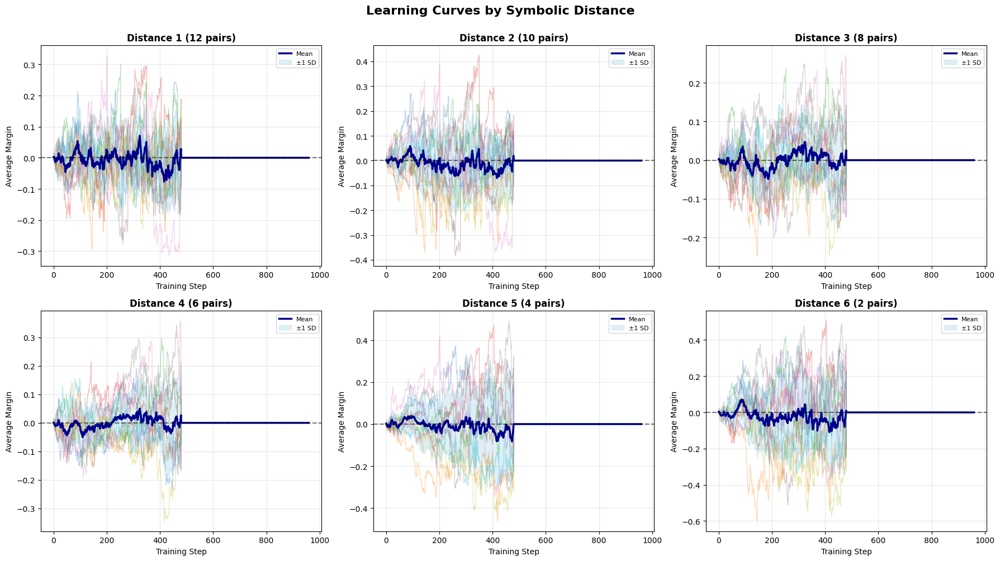

C:\Users\lukel\AppData\Local\Temp\ipykernel_47256\2346260724.py:111: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(box_data, labels=[f'Dist {d}' for d in valid_distances])


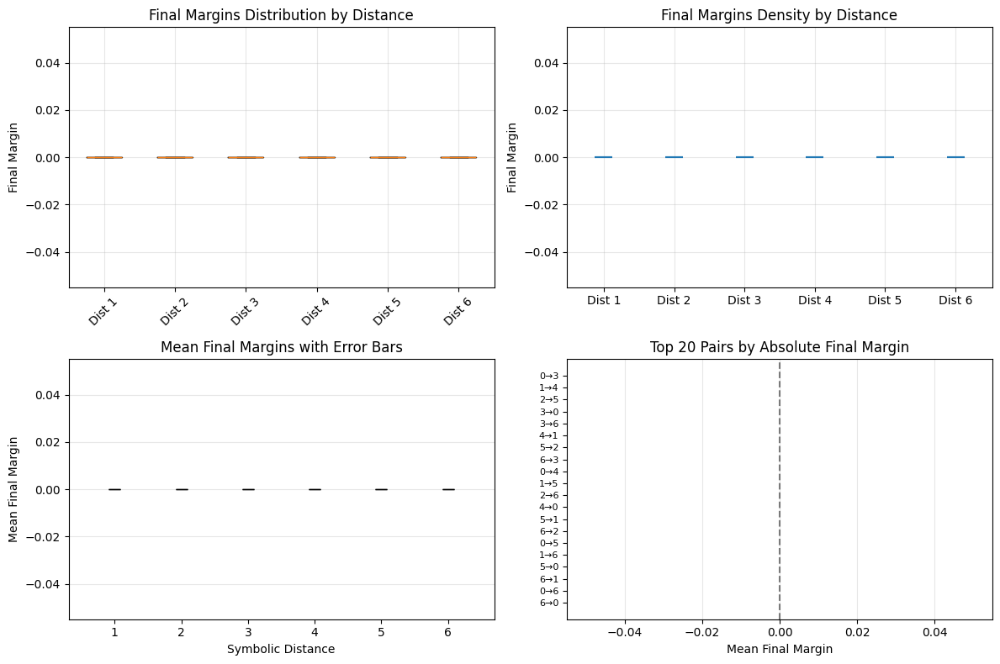


SYMBOLIC DISTANCE ANALYSIS SUMMARY

Distance 1 (12 pairs): [(0, 1), (1, 0), (1, 2), (2, 1), (2, 3), (3, 2), (3, 4), (4, 3), (4, 5), (5, 4), (5, 6), (6, 5)]
  Final margins - Mean: 0.0000, Std: 0.0000
  Final margins - Min: 0.0000, Max: 0.0000
  Condition n - sd = 7 - 1 = 6

Distance 2 (10 pairs): [(0, 2), (1, 3), (2, 0), (2, 4), (3, 1), (3, 5), (4, 2), (4, 6), (5, 3), (6, 4)]
  Final margins - Mean: 0.0000, Std: 0.0000
  Final margins - Min: 0.0000, Max: 0.0000
  Condition n - sd = 7 - 2 = 5

Distance 3 (8 pairs): [(0, 3), (1, 4), (2, 5), (3, 0), (3, 6), (4, 1), (5, 2), (6, 3)]
  Final margins - Mean: 0.0000, Std: 0.0000
  Final margins - Min: 0.0000, Max: 0.0000
  Condition n - sd = 7 - 3 = 4

Distance 4 (6 pairs): [(0, 4), (1, 5), (2, 6), (4, 0), (5, 1), (6, 2)]
  Final margins - Mean: 0.0000, Std: 0.0000
  Final margins - Min: 0.0000, Max: 0.0000
  Condition n - sd = 7 - 4 = 3

Distance 5 (4 pairs): [(0, 5), (1, 6), (5, 0), (6, 1)]
  Final margins - Mean: 0.0000, Std: 0.0000
  Fina

In [18]:
# =============================================================================
# Symbolic Distance Analysis and Plotting
# Add this as a new cell after training completes
# =============================================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict

def analyze_margins_by_distance(csv_path_symbolic, pairs_by_distance, valid_distances, items_n=7):
    """Analyze and plot margin data by symbolic distance"""
    
    # Load the enhanced CSV data
    df_symbolic = pd.read_csv(csv_path_symbolic)
    
    # Get unique runs
    unique_runs = df_symbolic['run'].unique()
    num_runs = len(unique_runs)
    
    print(f"Analyzing margin data from {csv_path_symbolic}")
    print(f"Runs: {num_runs}, Total rows: {len(df_symbolic)}")
    print("="*60)
    
    # 1. Plot separate learning curves for each distance (grouped by distance)
    n_distances = len(valid_distances)
    n_cols = 3
    n_rows = (n_distances + n_cols - 1) // n_cols
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 5*n_rows))
    axes = axes.flatten() if n_distances > 1 else [axes]
    
    for idx, distance in enumerate(valid_distances):
        ax = axes[idx]
        pairs = pairs_by_distance[distance]
        
        # Get column names for this distance
        pair_columns = [f"pair_{pair[0]}_{pair[1]}_dist_{distance}" for pair in pairs]
        
        # Plot each run separately for this distance
        for run in unique_runs:
            run_data = df_symbolic[df_symbolic['run'] == run]
            steps = run_data['step'].values
            
            # Average across all pairs of this distance for this run
            avg_margins = run_data[pair_columns].mean(axis=1).values
            
            ax.plot(steps, avg_margins, alpha=0.3, linewidth=1)
        
        # Calculate and plot mean across runs
        all_steps = []
        all_avg_margins = []
        
        for run in unique_runs:
            run_data = df_symbolic[df_symbolic['run'] == run]
            steps = run_data['step'].values
            avg_margins = run_data[pair_columns].mean(axis=1).values
            all_steps.extend(steps)
            all_avg_margins.extend(avg_margins)
        
        step_margins = defaultdict(list)
        for step, margin in zip(all_steps, all_avg_margins):
            step_margins[step].append(margin)
        
        steps_sorted = sorted(step_margins.keys())
        mean_margins = [np.mean(step_margins[step]) for step in steps_sorted]
        std_margins = [np.std(step_margins[step]) for step in steps_sorted]
        
        # Plot mean with error band
        ax.plot(steps_sorted, mean_margins, color='darkblue', linewidth=2.5, label='Mean')
        ax.fill_between(steps_sorted,
                        np.array(mean_margins) - np.array(std_margins),
                        np.array(mean_margins) + np.array(std_margins),
                        color='lightblue', alpha=0.4, label='±1 SD')
        
        ax.set_xlabel('Training Step', fontsize=10)
        ax.set_ylabel('Average Margin', fontsize=10)
        ax.set_title(f'Distance {distance} ({len(pairs)} pairs)', fontsize=12, fontweight='bold')
        ax.grid(True, alpha=0.3)
        ax.axhline(0, color='black', linestyle='--', alpha=0.5)
        ax.legend(fontsize=8)
    
    # Hide empty subplots
    for idx in range(n_distances, len(axes)):
        axes[idx].set_visible(False)
    
    plt.suptitle('Learning Curves by Symbolic Distance', fontsize=16, fontweight='bold', y=1.00)
    plt.tight_layout()
    plt.show()
    
    # 2. Final margins distribution by distance
    plt.figure(figsize=(12, 8))
    
    final_margins_by_distance = {}
    
    for distance in valid_distances:
        pairs = pairs_by_distance[distance]
        pair_columns = [f"pair_{pair[0]}_{pair[1]}_dist_{distance}" for pair in pairs]
        
        final_margins = []
        for run in unique_runs:
            run_data = df_symbolic[df_symbolic['run'] == run]
            final_step_data = run_data.iloc[-1]  # Last step
            final_margins.extend(final_step_data[pair_columns].values)
        
        final_margins_by_distance[distance] = final_margins
    
    # Box plot
    plt.subplot(2, 2, 1)
    box_data = [final_margins_by_distance[d] for d in valid_distances]
    plt.boxplot(box_data, labels=[f'Dist {d}' for d in valid_distances])
    plt.ylabel('Final Margin')
    plt.title('Final Margins Distribution by Distance')
    plt.grid(True, alpha=0.3)
    plt.xticks(rotation=45)
    
    # Violin plot
    plt.subplot(2, 2, 2)
    positions = range(1, len(valid_distances) + 1)
    parts = plt.violinplot(box_data, positions=positions)
    plt.xticks(positions, [f'Dist {d}' for d in valid_distances])
    plt.ylabel('Final Margin')
    plt.title('Final Margins Density by Distance')
    plt.grid(True, alpha=0.3)
    
    # Mean and std by distance
    plt.subplot(2, 2, 3)
    means = [np.mean(final_margins_by_distance[d]) for d in valid_distances]
    stds = [np.std(final_margins_by_distance[d]) for d in valid_distances]
    
    plt.bar(valid_distances, means, yerr=stds, capsize=5, alpha=0.7, color='steelblue')
    plt.xlabel('Symbolic Distance')
    plt.ylabel('Mean Final Margin')
    plt.title('Mean Final Margins with Error Bars')
    plt.grid(True, alpha=0.3, axis='y')
    plt.xticks(valid_distances)
    
    # Heatmap showing top pairs
    plt.subplot(2, 2, 4)
    
    # Create a matrix for visualization
    all_final_means = []
    labels = []
    for distance in valid_distances:
        pairs = pairs_by_distance[distance]
        for pair in pairs:
            pair_col = f"pair_{pair[0]}_{pair[1]}_dist_{distance}"
            final_values = []
            for run in unique_runs:
                run_data = df_symbolic[df_symbolic['run'] == run]
                final_values.append(run_data[pair_col].iloc[-1])
            all_final_means.append(np.mean(final_values))
            labels.append(f"{pair[0]}→{pair[1]}")
    
    # Plot top pairs by absolute margin
    sorted_indices = np.argsort(np.abs(all_final_means))[::-1][:20]  # Top 20
    top_means = [all_final_means[i] for i in sorted_indices]
    top_labels = [labels[i] for i in sorted_indices]
    
    colors_bar = ['green' if m > 0 else 'red' for m in top_means]
    plt.barh(range(len(top_means)), top_means, color=colors_bar, alpha=0.7)
    plt.yticks(range(len(top_labels)), top_labels, fontsize=8)
    plt.xlabel('Mean Final Margin')
    plt.title('Top 20 Pairs by Absolute Final Margin')
    plt.grid(True, alpha=0.3, axis='x')
    plt.axvline(0, color='black', linestyle='--', alpha=0.5)
    
    plt.tight_layout()
    plt.show()
    
    # 3. Print summary statistics
    print("\n" + "="*80)
    print("SYMBOLIC DISTANCE ANALYSIS SUMMARY")
    print("="*80)
    
    for distance in valid_distances:
        pairs = pairs_by_distance[distance]
        pair_columns = [f"pair_{pair[0]}_{pair[1]}_dist_{distance}" for pair in pairs]
        
        final_margins = []
        for run in unique_runs:
            run_data = df_symbolic[df_symbolic['run'] == run]
            final_step_data = run_data.iloc[-1]
            final_margins.extend(final_step_data[pair_columns].values)
        
        print(f"\nDistance {distance} ({len(pairs)} pairs): {pairs}")
        print(f"  Final margins - Mean: {np.mean(final_margins):.4f}, Std: {np.std(final_margins):.4f}")
        print(f"  Final margins - Min: {np.min(final_margins):.4f}, Max: {np.max(final_margins):.4f}")
        print(f"  Condition n - sd = {items_n} - {distance} = {items_n - distance}")
    
    return final_margins_by_distance

# =============================================================================
# RUN THE ANALYSIS
# =============================================================================

# Get pairs by distance (this should already be defined if you used the modified training function)
# If not, uncomment and run:
from collections import defaultdict
def get_symbolic_distance(i, j):
    return abs(j - i)
def get_all_pairs_by_distance(items_n):
    pairs_by_distance = defaultdict(list)
    for i in range(items_n):
        for j in range(items_n):
            if i != j:
                distance = get_symbolic_distance(i, j)
                if items_n - distance > 0:
                    pairs_by_distance[distance].append((i, j))
    return pairs_by_distance

pairs_by_distance = get_all_pairs_by_distance(items_n)
valid_distances = sorted(pairs_by_distance.keys())

# Specify the CSV path (update this to match your saved CSV)
csv_path_symbolic = "run_csvs/knowledge_assembly_gamma_0.0_symbolic_distances.csv"

# Run the analysis and create plots
final_margins_by_distance = analyze_margins_by_distance(
    csv_path_symbolic, 
    pairs_by_distance, 
    valid_distances,
    items_n=items_n
)

print("\n" + "="*80)
print("Analysis complete!")
print("="*80)



In [ ]:

import sys
results["train"]["evals"].size
print("evals is of size as defined: seeds x n_items x n_items")

In [ ]:
type(results)

import sys
print(sys.getsizeof(results))
print(training_length)
print(sys.getsizeof(results["train"]))

In [ ]:
np.zeros((1,3))

## Perform gridsearch to find optimal hyperparameters

In [ ]:
mse_grids = []
for i, performer in enumerate([low_performers, high_performers]):
    mse_grid = np.zeros((len(gammas), len(ss)))
    for j, gamma in enumerate(gammas):
        for k, s in enumerate(ss):
            mses = np.zeros(seeds_n)
            for seed in range(seeds_n):
                fitted = expit(s * results[gamma]["stitch"]["evals"][seed])
                mses[seed] = mean_squared_error(fitted, performer, True)
            mse_grid[j, k] = np.mean(mses)
    mse_grids.append(mse_grid)

optimal_values = {
    "low_performers": {"pos_x": [], "pos_y": [], "gamma": [], "s": []},
    "high_performers": {"pos_x": [], "pos_y": [], "gamma": [], "s": []}
}

for mode, mse_grid in zip(["low_performers", "high_performers"], mse_grids):
    for threshold in [1., 0.5]:
        pos_y, pos_x = np.unravel_index(mse_grid[gammas < threshold, :].argmin(), mse_grid.shape)
        optimal_values[mode]["pos_x"].append(pos_x)
        optimal_values[mode]["s"].append(ss[pos_x])
        optimal_values[mode]["pos_y"].append(pos_y)
        optimal_values[mode]["gamma"].append(gammas[pos_y])

sgd = 0.
stitchers = optimal_values["high_performers"]["gamma"][0]
non_stitchers = optimal_values["low_performers"]["gamma"][0]

print(optimal_values)

## Create plots

In [ ]:
blue, blue2, red, red2, magma_3 = plotting_init()

### Network output and choice matrix

### Test accuracy

In [ ]:
means = np.mean(results[sgd]["train"]["training_progress"], axis=0)
progresses = [[] for _ in range(6)]
for distance in range(6):
    for item_1 in range(6):
        for item_2 in range(6):
            if item_2 - item_1 == distance:
                for x_offset in [0, 6]:
                    for y_offset in [0, 6]:
                        progresses[distance].append(means[:, item_1 + x_offset, item_2 + y_offset])

fig, ax = plt.subplots(figsize=(3, 3))
fig.patch.set_facecolor('white')
colors = []
for distance in range(1, 6):
    color = plt.cm.magma(distance / 6.)
    colors.append(color)
    progress = expit(s * np.asarray(progresses[distance]))
    mean = np.mean(progress, axis=0)
    sem = np.std(progress, axis=0) / np.sqrt(progress.shape[0])
    ax.plot(mean, color=color, label=distance)
    ax.fill_between(range(len(mean)), mean - sem, mean + sem, color=color, alpha=0.3)
ax.set_yticks([0.5, 1.])
ax.set_yticklabels([50, 100])
ax.set_xticks([0., 960.])
ax.set_title("Test Accuracy", pad=12.)
ax.set_xlabel("Training Step", labelpad=-5.)
ax.set_ylabel("%", labelpad=-15.)

for pos in ["left", "bottom"]:
    ax.spines[pos].set_linewidth(1)
    ax.spines[pos].set_color([0.7]*3)

    ax.legend(title="  abs(distance)", prop={"weight": "bold"}, ncol=6, frameon=False, handlelength=0,
              columnspacing=0.1, labelspacing=0.65, labelcolor=colors)
sns.despine()
fig.tight_layout()

## RDMs and MDSs

In [ ]:
positions = [.1, .25, 1.]

fig, axs = plt.subplots(2, 3, figsize=(8., 5), constrained_layout=True)
fig.patch.set_facecolor('white')

# Extraxt maximum euclidean distance
all_h1s = np.mean(results[sgd]["train"]["h1s"], axis=0)

steps_after_training = all_h1s.shape[0] - 1

# Plot euclidean distances
vmax = 0.
for i in range(3):
    h1s = all_h1s[int(positions[i] * steps_after_training)]
    vmax_ = np.round(np.max(euclidean_distances(h1s)), 1)
    if vmax_ > vmax:
        vmax = vmax_

for i in range(3):
    h1s = all_h1s[int(positions[i] * steps_after_training)]
    im = matrix_plot(euclidean_distances(h1s), axs[0, i], items_n, 0., vmax)
    axs[0, i].set_title(f"test_short trial {int(positions[i] * steps_after_training) + 1}", pad=15)

cbar = fig.colorbar(im, ax=axs[0, i], anchor=(0., 0.5), shrink=.4, aspect=7.)
cbar.set_ticks([])
cbar.ax.text(.7, vmax*1.22, vmax, ha='center', va='center')
cbar.ax.text(.5, -0.25, 0, ha='center', va='center')
cbar.set_label("a.u.")
cbar.outline.set_edgecolor([0.5] * 3)

# Plot MDSs
for i in range(3):
    distances = euclidean_distances(all_h1s[int(positions[i] * steps_after_training)])
    mds = manifold.MDS(n_components=2, eps=1e-9, dissimilarity="precomputed", random_state=mds_seed,
                       normalized_stress="auto")
    d1, d2 = mds.fit(distances).embedding_.T

    if i == 0:
        rotate(d1, d2, 250.)
    if i == 1:
        rotate(d1, d2, 230.)
    else:
        rotate(d1, d2, 260.)

    mds_plot((d1, d2), axs[1, i], items_n)

    lim = 0.50
    axs[1, i].set_xlim(-lim, lim)
    axs[1, i].set_ylim(-lim, lim)
    axs[1, i].set_xticks([-0.5, 0.5])
    axs[1, i].set_yticks([-0.5, 0.5])
    
    # Set border color
    for pos in ["left", "bottom"]:
        axs[1, i].spines[pos].set_linewidth(1)
        axs[1, i].spines[pos].set_color([0.5]*3)

    axs[1, i].set_xlabel("dimension 1\na.u.", labelpad=-6.)
    axs[1, i].set_ylabel("dimension 2", labelpad=-11.)

## RDMs and MDSs after train short and train long

In [ ]:
fig1, axs1 = plt.subplots(2, 4, figsize=(13*1.2, 6.25*1.2), constrained_layout=True)
fig1.patch.set_facecolor('white')
fig2, axs2 = plt.subplots(1, 4, figsize=(13*1.2, 3.35*1.2), constrained_layout=True)
fig2.patch.set_facecolor('white')

for i, key in enumerate([sgd, stitchers, non_stitchers]):
    if i < 2:
        axs = axs1
    else:
        axs = axs2.reshape(1, -1)
        i = 0
    
    # MDS
    for k, timepoint in enumerate(["train", "stitch"]):
        h1s = np.mean(np.asarray(results[key][timepoint]["h1s"]), 0)[-1]
        distances = euclidean_distances(h1s)
        mds = manifold.MDS(n_components=2, eps=1e-9, dissimilarity="precomputed", random_state=mds_seed,
                           normalized_stress="auto")
        d1, d2 = mds.fit(distances).embedding_.T
        
        
        
        if mode == "two-readouts":
            if i == 0:
                if k == 0:
                    rotate(d1, d2, 50.) if axs is axs1 else rotate(d1, d2, 55.)
                else:
                    rotate(d1, d2, 70.) if axs is axs1 else rotate(d1, d2, 35.)
            else:
                if k == 0:
                    rotate(d1, d2, 120.)
                else:
                     rotate(d1, d2, 340.)

            mds_plot((d1, d2), axs[i, k], items_n)

            axs[i, k].set_xlim(-2.05, 1.)
            axs[i, k].set_ylim(-.55, .55)
            axs[i, k].set_yticks([-0.5, 0., 0.5])
            if i == 1 and k == 1:
                axs[i, k].set_ylim(-1.1, 1.1)
                axs[i, k].set_yticks([-1, 0, 1])
        
        else:
            if i == 0:
                if k == 0:
                    rotate(d1, d2, 50.) if axs is axs1 else rotate(d1, d2, 55.)
                else:
                    rotate(d1, d2, 140.) if axs is axs1 else rotate(d1, d2, 50.)
            else:
                if k == 0:
                    rotate(d1, d2, 50.)
                else:
                     rotate(d1, d2, 40.)

            mds_plot((d1, d2), axs[i, k], items_n)

            axs[i, k].set_xlim(-4.5, 1.5)
            axs[i, k].set_ylim(-.5, .5)
            axs[i, k].set_yticks([-0.5, 0.5])
            if i == 1 and k == 1:
                axs[i, k].set_ylim(-1.3, 1.3)
                axs[i, k].set_yticks([-1, 0, 1])
            
    # Set border color
    for pos in ["left", "bottom"]:
        for n in range(2):
            axs[i, n].spines[pos].set_linewidth(1)
            axs[i, n].spines[pos].set_color([0.5]*3)
    
    axs[0, 0].set_title("After train_short", pad=16.)
    axs[0, 1].set_title("After train_long", pad=16.)
    for n in range(2):
        if (axs.shape[0] == 2 and i == 1) or axs.shape[0] == 1:
            axs[i, n].set_xlabel("dimension 1")
        axs[i, 0].set_ylabel("dimension 2", labelpad=-7.5)
        
    
    # Certainty matrices
    for k, timepoint in enumerate(["train", "stitch"]):
        ins = axs[i, k].inset_axes([0.05, 0.5, 0.4, 0.4])
        certainties = np.mean(results[key][timepoint]["certainties"], axis=0)[-1]
        im = matrix_plot(certainties, ins, items_n, 0., 1.)
        ins.set_xticks([])
        ins.set_yticks([])
        ins.set_title("Certainty A", fontsize=9., pad=10)
        
        ins = axs[i, k].inset_axes([0.49, 0.6, 0.027, 0.2])
        cbar = fig.colorbar(im, cax=ins, orientation='vertical')
        cbar.set_ticks([0, 1])
        cbar.outline.set_edgecolor([0.5] * 3)
    
    sns.despine(ax=axs[i, 0])
    sns.despine(ax=axs[i, 1])
    

    # Euclidean Distances
    h1s = np.mean(results[key]["stitch"]["h1s"], 0)[-1]
    distances = euclidean_distances(h1s)
    
    im = matrix_plot(distances, axs[i, 2], items_n, 0, np.max(distances))
    shrink, aspect = (0.4, 10)
    cbar = fig.colorbar(im, ax=axs[i, 2], anchor=(0., 0.5), shrink=shrink, aspect=aspect)
    cbar.set_ticks([])
    vmax = np.round(np.max(distances), 2)
    if i == 0:
        cbar.ax.text(.4, -0.25, 0, ha='center', va='center')
        cbar.ax.text(.65, vmax * 1.15, vmax, ha='center', va='center')
    if i == 1:
        cbar.ax.text(0.3, -0.5, 0, ha='center', va='center')
        cbar.ax.text(0.5, vmax * 1.15, vmax, ha='center', va='center')
    cbar.set_label("a.u.")
    cbar.outline.set_edgecolor([0.5] * 3)
    
    axs[0, 2].set_title("Euclidean Distances", pad=20.)

    # Network Choice Matrix
    behaviour = high_performers if i == 1 else low_performers
    evals = np.mean(results[key]["stitch"]["evals"], 0)
    s = fit_sigmoid(evals, behaviour, initial_s=0.01, exclude_diagonal=True)
    fit = expit(s * evals)
    np.fill_diagonal(fit, np.nan)

    im = matrix_plot(fit, axs[i, 3], items_n, 0, 1)
    cbar = fig.colorbar(im, ax=axs[i, 3], anchor=(0., 0.5), shrink=shrink, aspect=aspect)
    cbar.set_ticks([])
    cbar.ax.text(0.5, 1.1, 1, ha='center', va='center')
    cbar.ax.text(0.5, -0.12, 0, ha='center', va='center')
    cbar.set_label("$p\ (>)$")
    cbar.outline.set_edgecolor([0.5] * 3)

    axs[0, 3].set_title("Network Choice Matrix", pad=20.);

## Performance after train short for different gammas

In [ ]:
fig, axs = plt.subplots(3, 2, figsize=(3.3, 4))
fig.patch.set_facecolor('white')

sgd_train_loss = np.mean(results[sgd]["train"]["losses"], axis=0)
sgd_stitch_loss = np.mean(results[sgd]["stitch"]["losses"], axis=0)
for n, (gamma, label) in enumerate(zip([sgd, stitchers, non_stitchers], ["Low Performers", "High Performers", "Low Performers"])):
    post = "" if gamma != 0. else " (SGD)"
    label = f"{label}\n$\gamma$ = {np.round(gamma, 2)}" + post
    axs[n, 0].plot(np.mean(results[gamma]["train"]["losses"], axis=0), color=magma_3[n])
    axs[n, 1].plot(np.mean(results[gamma]["stitch"]["losses"], axis=0), color=magma_3[n], label=label)
    
    if n < 2:
        axs[n, 0].set_xticklabels([])
        axs[n, 1].set_xticklabels([])
    
    for i in range(2):
        axs[n, i].set_ylabel("Loss")
    
    for pos in ["left", "bottom"]:
        for i in range(2):
            axs[n, i].spines[pos].set_linewidth(1)
            axs[n, i].spines[pos].set_color([0.5]*3)

axs[0, 0].set_title("Train Short", pad=15)
axs[0, 1].set_title("Train Long", pad=15)

axs[2, 0].set_xlabel("Training Step")
axs[2, 1].set_xlabel("Stitching Step")

box = axs[2, 1].get_position()
axs[2, 1].set_position([box.x0, box.y0, box.width * 0.8, box.height])
fig.legend(loc='center left', bbox_to_anchor=(1, 0.5), framealpha=0.)


# Set border color
sns.despine()
fig.tight_layout()

## Fits for s and MSE for vairous values of gamma

In [ ]:
fig, axs = plt.subplots(2, 1, figsize=(1.5, 4))
fig.patch.set_facecolor('white')
for gamma in gammas:
    evaluation = np.mean(results[gamma]["train"]["evals"], axis=0)
    s = fit_sigmoid(evaluation, midd_performance, initial_s=.1, exclude_diagonal=True)
    axs[0].scatter(gamma, s, color="red", s=1.5)
    axs[0].set_ylim(1.3, 1.4)
    axs[0].set_yticks([1.3, 1.4])
    axs[0].set_ylabel("s", labelpad=-14)
    axs[0].set_xlabel("$\gamma$")
    
    fit = expit(s * evaluation)
    mse = mean_squared_error(fit, midd_performance, exclude_diagonal=True)
    axs[1].scatter(gamma, mse, color="green", s=1.5)
    axs[1].set_ylim(0., .01)
    axs[1].set_yticks([0., .01])
    axs[1].set_xticks([0., 1.])
    axs[1].set_ylabel(" MSE", labelpad=-21.)
    axs[1].set_xlabel("$\gamma$")

axs[0].set_title("After Train Short", pad=15)

sns.despine()
fig.tight_layout()

## Grid search and optimal parameters

In [ ]:
zero_repeat = 2
zero_offset = 2
vmax = np.round(np.max(mse_grids), 2)

fig, axs = plt.subplots(1, 2, sharex=True, sharey=True, figsize=(8, 5), constrained_layout=True)
fig.patch.set_facecolor('white')

for i, (mode, mse_grid) in enumerate(zip(["low_performers", "high_performers"], mse_grids)):    
    mse_grid = np.insert(mse_grid, [1] * (zero_offset + zero_repeat), np.nan, axis=0)
    for j in range(zero_repeat):
        mse_grid[j + 1, :] = mse_grid[0, :]
    im = axs[i].imshow(mse_grid, vmin=0., vmax=vmax, cmap=plt.cm.magma)
    
    for pos_x, pos_y in zip(optimal_values[mode]["pos_x"], optimal_values[mode]["pos_y"]):
        axs[i].scatter(pos_x, pos_y + zero_offset, c="w", marker="x")
    
    axs[i].set_xticks([16 * i for i in range(5)])
    axs[i].set_xticklabels(["$1e^{" + str(i) + "}$" for i in range(-2, 3)])
    axs[i].set_xlabel("s")

    for pos in ["top", "right", "bottom", "left"]:
        axs[i].spines[pos].set_linewidth(1.)
        axs[i].spines[pos].set_color([0.5]*3)

    cbar = fig.colorbar(im, ax=axs[i], shrink=0.23, aspect=7.6)
    cbar.set_ticks([])
    cbar.ax.text(0.5, -0.025, 0, ha='center', va='center')
    cbar.ax.text(0.5, vmax * 1.1, vmax, ha='center', va='center')
    cbar.set_label("MSE")

axs[0].set_title("Low Performers", pad=15.)
axs[1].set_title("High Performers", pad=15.)

axs[0].set_yticks([0] + [zero_repeat + zero_offset + 1 + 17 * i for i in range(5)])
axs[0].set_yticklabels(["0"] + ["$1e^{" + str(i) + "}$" for i in range(-4, 1)])
axs[0].set_ylabel("$\gamma$");

## Difference between fits

In [ ]:
optimal_gamma_1 = optimal_values["low_performers"]["gamma"][0]
optimal_gamma_2 = optimal_values["low_performers"]["gamma"][1]
optimal_s_1 = optimal_values["low_performers"]["s"][0]
optimal_s_2 = optimal_values["low_performers"]["s"][1]

eval_1 = np.mean(results[optimal_gamma_1]["stitch"]["evals"], 0)
eval_2 = np.mean(results[optimal_gamma_2]["stitch"]["evals"], 0)

fit1 = expit(optimal_s_1 * eval_1)
fit2 = expit(optimal_s_2 * eval_2)

squared_difference = (fit1 - fit2)**2

vmax = np.round(np.max(squared_difference), 2)

fig, ax = plt.subplots(figsize = (3., 3.))
fig.patch.set_facecolor('white')

im = matrix_plot(squared_difference, ax, items_n, 0, vmax)


cbar = fig.colorbar(im, ax=ax, shrink=.3, aspect=4.)
cbar.set_ticks([])
cbar.ax.text(0.0055, -0.0015, 0, ha='center', va='center')
cbar.ax.text(0.006, vmax * 1.15, vmax, ha='center', va='center')
cbar.set_label("S E")

ax.set_xticks([])
ax.set_yticks([])

ax.set_title("Difference of Fits", pad=10)
fig.tight_layout()